# The stability of the global average on different window lengths
This notebook outllines different methods that can be used to de-trend the LongRunMIP and ZECMIP time series.

# Imports

In [1]:
import nc_time_axis
import warnings

import xarray as xr
import numpy as np
import pandas as pd
from importlib import reload
from numba import njit
from scipy.stats import spearmanr
import matplotlib.pyplot as plt
import cartopy.crs as ccrs
import matplotlib.gridspec as gridspec 
from matplotlib.axes import Axes
import matplotlib as mpl
import time
import pymannkendall
import os
import sys
import string

from numpy.typing import ArrayLike
from typing import Optional, Callable, List, Tuple, Dict

warnings.filterwarnings('ignore')

In [2]:
sys.path.append(os.path.join(os.getcwd(), 'Documents/PhD'))

In [3]:
import constants
from constants import PlotConfig
sys.path.append(constants.MODULE_DIR)
import sn_plotting
import xarray_class_accessors as xca
import utils
import stats
import xarray_extender as xce
import signal_to_noise as sn
import open_ds
from classes import ExperimentTypes, LocationsLatLon
import plotting_functions
import xarray_extender as xe

logger = utils.get_notebook_logger()

In [4]:
notebook_number='01'

In [5]:
%matplotlib inline

In [6]:
from dask.distributed import Client
client = Client()
client

- State start
-   Scheduler at:     tcp://127.0.0.1:42531
-   dashboard at:            127.0.0.1:8787
-         Start Nanny at: 'tcp://127.0.0.1:35953'
-         Start Nanny at: 'tcp://127.0.0.1:33243'
-         Start Nanny at: 'tcp://127.0.0.1:44833'
-         Start Nanny at: 'tcp://127.0.0.1:35571'
-         Start Nanny at: 'tcp://127.0.0.1:39563'
-         Start Nanny at: 'tcp://127.0.0.1:45819'
-         Start Nanny at: 'tcp://127.0.0.1:39635'
- Register worker <WorkerState 'tcp://127.0.0.1:33101', name: 1, status: init, memory: 0, processing: 0>
- Starting worker compute stream, tcp://127.0.0.1:33101
- Starting established connection to tcp://127.0.0.1:58940
- Register worker <WorkerState 'tcp://127.0.0.1:44061', name: 4, status: init, memory: 0, processing: 0>
- Starting worker compute stream, tcp://127.0.0.1:44061
- Starting established connection to tcp://127.0.0.1:58946
- Register worker <WorkerState 'tcp://127.0.0.1:46665', name: 2, status: init, memory: 0, processing: 0>
- S

Connection method: Cluster object,Cluster type: distributed.LocalCluster
Dashboard: /proxy/8787/status,
Dashboard: /proxy/8787/status,Workers: 7
Total threads: 7,Total memory: 32.00 GiB
Status: running,Using processes: True
Comm: tcp://127.0.0.1:42531,Workers: 7
Dashboard: /proxy/8787/status,Total threads: 7
Started: Just now,Total memory: 32.00 GiB
Comm: tcp://127.0.0.1:33293,Total threads: 1
Dashboard: /proxy/35161/status,Memory: 4.57 GiB
Nanny: tcp://127.0.0.1:35953,


In [168]:
client.close()

- Closing Nanny at 'tcp://127.0.0.1:35953'. Reason: nanny-close
- Nanny asking worker to close. Reason: nanny-close
- Closing Nanny at 'tcp://127.0.0.1:33243'. Reason: nanny-close
- Nanny asking worker to close. Reason: nanny-close
- Stopping worker at tcp://127.0.0.1:33293. Reason: nanny-close
- Connection to tcp://127.0.0.1:42531 has been closed.
- Closing Nanny at 'tcp://127.0.0.1:44833'. Reason: nanny-close
- Nanny asking worker to close. Reason: nanny-close
- Stopping worker at tcp://127.0.0.1:33101. Reason: nanny-close
- Closing Nanny at 'tcp://127.0.0.1:35571'. Reason: nanny-close
- Nanny asking worker to close. Reason: nanny-close
- Stopping worker at tcp://127.0.0.1:46665. Reason: nanny-close
- Connection to tcp://127.0.0.1:42531 has been closed.
- Closing Nanny at 'tcp://127.0.0.1:39563'. Reason: nanny-close
- Nanny asking worker to close. Reason: nanny-close
- Closing Nanny at 'tcp://127.0.0.1:45819'. Reason: nanny-close
- Nanny asking worker to close. Reason: nanny-close
- 

2023-05-11 13:17:52,141 - distributed.nanny - WARNING - Worker process still alive after 3.199996490478516 seconds, killing


- Worker process still alive after 3.199996490478516 seconds, killing


2023-05-11 13:17:52,143 - distributed.nanny - WARNING - Worker process still alive after 3.1999983215332035 seconds, killing


- Worker process still alive after 3.1999983215332035 seconds, killing


2023-05-11 13:17:52,145 - distributed.nanny - WARNING - Worker process still alive after 3.1999989318847657 seconds, killing


- Worker process still alive after 3.1999989318847657 seconds, killing


2023-05-11 13:17:52,147 - distributed.nanny - WARNING - Worker process still alive after 3.1999990844726565 seconds, killing


- Worker process still alive after 3.1999990844726565 seconds, killing


2023-05-11 13:17:52,148 - distributed.nanny - WARNING - Worker process still alive after 3.1999992370605472 seconds, killing


- Worker process still alive after 3.1999992370605472 seconds, killing


2023-05-11 13:17:52,149 - distributed.nanny - WARNING - Worker process still alive after 3.199999389648438 seconds, killing


- Worker process still alive after 3.199999389648438 seconds, killing


2023-05-11 13:17:52,150 - distributed.nanny - WARNING - Worker process still alive after 3.1999989318847657 seconds, killing


- Worker process still alive after 3.1999989318847657 seconds, killing
- Worker process 258821 was killed by signal 9
- Worker process 258815 was killed by signal 9
- Worker process 258811 was killed by signal 9
- Worker process 258831 was killed by signal 9
- Worker process 258819 was killed by signal 9
- Worker process 258829 was killed by signal 9
- Worker process 258825 was killed by signal 9
- Scheduler closing...
- Scheduler closing all comms


In [8]:
# from dask_jobqueue import PBSCluster
# # One node on Gadi has 48 cores - try and use up a full core before going to multiple nodes (jobs)

# walltime = '00:10:00'
# cores = 48
# memory = str(cores * 4) + 'GB'

# cluster = PBSCluster(walltime=str(walltime), cores=cores, memory=str(memory), processes=cores,
#                      job_extra_directives=['-q normal',
#                                            '-P w42',
#                                            '-l ncpus='+str(cores),
#                                            '-l mem='+str(memory),
#                                            '-l storage=gdata/w42+gdata/rt52'],
#                      local_directory='$TMPDIR',
#                      job_directives_skip=["select"])
# cluster.scale(jobs=1)
# client = Client(cluster)

# Loading Data

In [9]:
experiment_params = constants.EXPERIMENTS_TO_RUN[0]
experiment_params

{'variable': 'tas', 'mask': None, 'hemisphere': 'global'}

In [10]:
constants.ZECMIP_LOCAL_REGRIDDED_DIR,

('/g/data/w40/ab2313/PhD/zecmip/regridded',)

In [11]:
reload(xca)

<module 'xarray_class_accessors' from '/home/563/ab2313/Documents/PhD/modules/xarray_class_accessors.py'>

In [12]:
experiment_zec_da = open_ds.open_mfdataset_nc(os.path.join(constants.ZECMIP_LOCAL_REGRIDDED_DIR, 'A1'), 
                                              to_array=False).tas
picontrol_zec_da = open_ds.open_mfdataset_nc(os.path.join(constants.ZECMIP_LOCAL_REGRIDDED_DIR, 'picontrol'),
                                             to_array=False).tas

In [101]:
picontrol_zec_da = picontrol_zec_da - 273.15

In [102]:
experiment_zec_ds_smean = sn.calculate_global_value(experiment_zec_da, experiment_params["variable"]).chunk('auto')
picontrol_zec_ds_smean = sn.calculate_global_value(picontrol_zec_da, experiment_params["variable"]).chunk('auto')

(None, None)
(None, None)


In [14]:
experiment_zec_ds_smean_anom = (experiment_zec_ds_smean -\
                               experiment_zec_ds_smean.isel(time=slice(None, 10)).mean(dim='time')).chunk('auto')

In [15]:
experiment_zec_ds_smean_anom

<xarray.DataArray 'tas' (time: 100, model: 8)>
dask.array<sub, shape=(100, 8), dtype=float64, chunksize=(100, 8), chunktype=numpy.ndarray>
Coordinates:
  * time     (time) object 0001-12-31 00:00:00 ... 0100-12-31 00:00:00
  * model    (model) object 'CESM2' 'CanESM5' ... 'NorESM2-LM' 'UKESM1-0-LL'
    height   float64 2.0

# Global

## Calculations

In [16]:
trend_da = stats.trend_fit(experiment_zec_ds_smean_anom, method='polynomial', order=3)
detrended_da = experiment_zec_ds_smean_anom - trend_da

In [17]:
constants.ZECMIP_MULTI_WINDOW_RUN_PARAMS

{'start_window': 11, 'end_window': 51, 'step_window': 2}

In [18]:
ZECMIP_MULTI_WINDOW_RUN_PARAMS = {'start_window': 10, 'end_window': 41, 'step_window': 1}

In [19]:
sn_multi_static_ds = sn.multiwindow_signal_to_nosie_and_bounds(
    experiment_zec_ds_smean_anom, picontrol_zec_ds_smean,
    rolling_noise=False, da_for_noise = detrended_da, parallel=False,
    logginglevel='ERROR', return_all=True,
    **ZECMIP_MULTI_WINDOW_RUN_PARAMS)


Experiment
--------
10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 
Concatenating objects - PLEASE be patient!
 - Finished

Control
------

10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 
Concatenating objects - PLEASE be patient!
Persist
Calculating bounds
final merge


In [20]:
sn_multi_rolling_ds = sn.multiwindow_signal_to_nosie_and_bounds(
    experiment_zec_ds_smean_anom, picontrol_zec_ds_smean,
    rolling_noise=True, da_for_noise = detrended_da, parallel=False,
    logginglevel='ERROR', return_all=True,
    **ZECMIP_MULTI_WINDOW_RUN_PARAMS)


Experiment
--------
10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 
Concatenating objects - PLEASE be patient!
 - Finished

Control
------

10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34, 35, 36, 37, 38, 39, 40, 
Concatenating objects - PLEASE be patient!
Persist
Calculating bounds
- Event loop was unresponsive in Scheduler for 4.58s.  This is often caused by long-running GIL-holding functions or moving large chunks of data. This can cause timeouts and instability.
- Event loop was unresponsive in Nanny for 4.58s.  This is often caused by long-running GIL-holding functions or moving large chunks of data. This can cause timeouts and instability.
- Event loop was unresponsive in Nanny for 4.58s.  This is often caused by long-running GIL-holding functions or moving large chunks of data. This can cause timeouts and instability.
- Event loop was unresponsive in N

In [21]:
max_effective_length = 50

In [22]:
# Number of models stable at each time step.
rolling_stability_levels_ds = sn.stability_levels(sn_multi_rolling_ds).chunk('auto')
static_stability_levels_ds = sn.stability_levels(sn_multi_static_ds).chunk('auto')

# Year when models first become stable.
rolling_year_stable = sn.get_stable_year_ds(sn_multi_rolling_ds, max_effective_length=max_effective_length).chunk('auto')
static_year_stable = sn.get_stable_year_ds(sn_multi_static_ds, max_effective_length=max_effective_length).chunk('auto')

Replacing points greater than 50 with 50
Replacing points greater than 50 with 50


In [23]:
unstable_rolling = sn_multi_rolling_ds.utils.above_or_below(
                                'signal_to_noise', greater_than_var='upper_bound', less_than_var='lower_bound').chunk('auto')
unstable_rolling

<xarray.Dataset>
Dimensions:          (time: 100, model: 8, window: 31)
Coordinates:
  * time             (time) object 0001-12-31 00:00:00 ... 0100-12-31 00:00:00
  * model            (model) object 'CESM2' 'CanESM5' ... 'UKESM1-0-LL'
  * window           (window) int64 10 11 12 13 14 15 16 ... 35 36 37 38 39 40
    height           float64 2.0
Data variables:
    signal_to_noise  (window, time, model) float64 dask.array<chunksize=(31, 100, 8), meta=np.ndarray>

In [24]:
stable_anom_da = sn.get_stabel_average_anomaly_over_windows(experiment_zec_ds_smean_anom,
                                               rolling_year_stable.squeeze().time, local=False);stable_anom_da

<function get_stable_average_anomaly_global at 0x14f0c4e6bd30>
- full garbage collection released 15.91 MiB from 0 reference cycles (threshold: 9.54 MiB)
- Event loop was unresponsive in Worker for 6.37s.  This is often caused by long-running GIL-holding functions or moving large chunks of data. This can cause timeouts and instability.
- Event loop was unresponsive in Worker for 6.28s.  This is often caused by long-running GIL-holding functions or moving large chunks of data. This can cause timeouts and instability.
- Event loop was unresponsive in Worker for 6.39s.  This is often caused by long-running GIL-holding functions or moving large chunks of data. This can cause timeouts and instability.
- Event loop was unresponsive in Worker for 6.38s.  This is often caused by long-running GIL-holding functions or moving large chunks of data. This can cause timeouts and instability.
- Event loop was unresponsive in Worker for 6.38s.  This is often caused by long-running GIL-holding functions

<xarray.DataArray 'temp' (window: 31, model: 8)>
dask.array<add, shape=(31, 8), dtype=float64, chunksize=(31, 8), chunktype=numpy.ndarray>
Coordinates:
  * model     (model) object 'CESM2' 'CanESM5' ... 'NorESM2-LM' 'UKESM1-0-LL'
  * window    (window) int64 10 11 12 13 14 15 16 17 ... 33 34 35 36 37 38 39 40
    height    float64 2.0
    variable  <U15 'signal_to_noise'

# Plotting

In [25]:
units = constants.VARIABLE_INFO[experiment_params["variable"]]["units"]
longname = constants.VARIABLE_INFO[experiment_params["variable"]]['longname']
hemisphere_title = string.capwords(experiment_params['hemisphere'].replace('_', ' '))
mask_title = f'({experiment_params["mask"]} only)' if experiment_params["mask"] else ''

In [26]:
model = 2

In [27]:
experiment_zec_ds_smean_anom.model.values#[model]

array(['CESM2', 'CanESM5', 'GFDL-ESM4', 'GISS-E2-1-G-CC', 'MIROC-ES2L',
       'MPI-ESM1-2-LR', 'NorESM2-LM', 'UKESM1-0-LL'], dtype=object)

In [28]:
# Manual Calculation for Demonstations
WINDOW=25
# Sample period is the years that we want to look at
sample_period = (0,WINDOW) #(1200,1261), 61

# The length of the sample_period varible
window_length = WINDOW

# Subset
sample_data = experiment_zec_ds_smean_anom.isel(time=slice(*sample_period), model=model)
sample_values = sample_data.values
x = np.arange(len(sample_values))

# Gradient and y-intercept of the sample data (use=[0,1] will return grad and y intercept)
p = np.polyfit(x=x, y=sample_values, deg=1)
fitted_line = np.polyval(p, x=x)

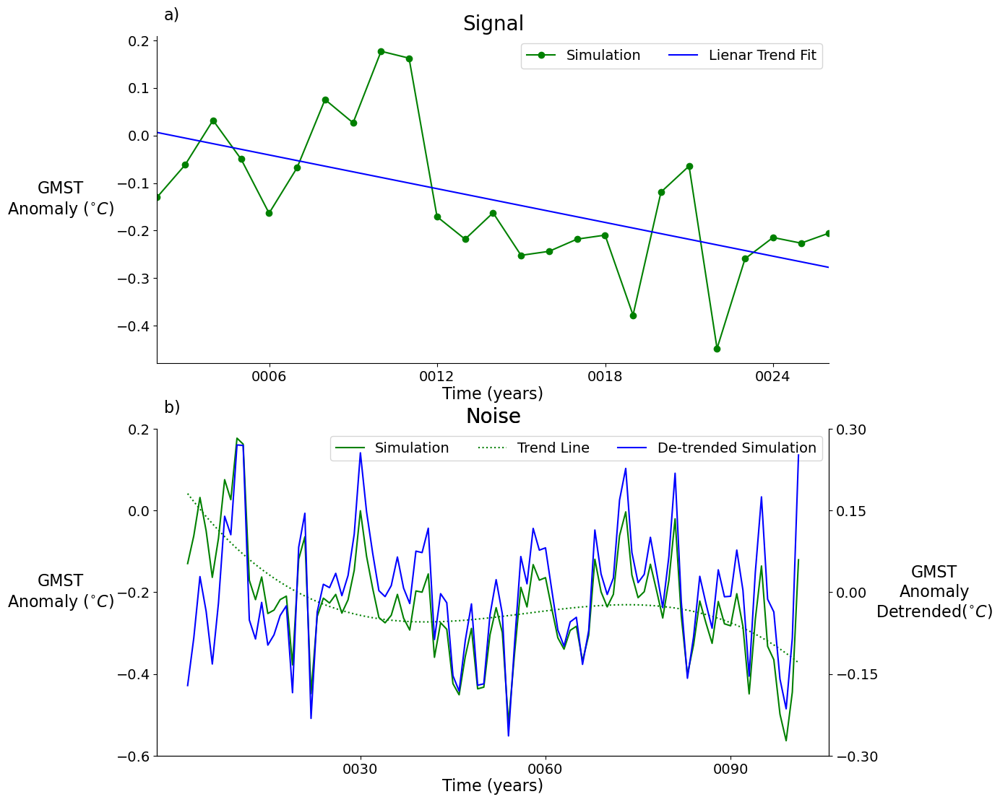

In [29]:
plt.style.use('default')
fig = plt.figure(figsize=(12,20))
axes = [fig.add_subplot(3,1,i) for i in range(1,3)]


# ---> axes[0]
sample_data.plot(ax=axes[0], marker='o', label='Simulation', color='green')
axes[0].plot(sample_data.time.values, fitted_line, label='Lienar Trend Fit', color='blue')
axes[0].set_xlim(sample_data.time.values[0], sample_data.time.values[-1])
axes[0].legend(ncol=2, fontsize=constants.PlotConfig.legend_text_size)

plotting_functions.format_axis(axes[0], title='Signal', xlabel='Time (years)', ylabel='GMST\n'+r'Anomaly ($^{\circ}C$)',
                               labelpad=55, invisible_spines=['top', 'right'])
plotting_functions.add_figure_label(axes[0], 'a)')

# ---> axes[1]
ax1 = axes[1]; ax2 = axes[1].twinx()
lns1 = experiment_zec_ds_smean_anom.isel(model=model).plot(ax=ax1, color='green', label='Simulation')
lns2 = trend_da.isel(model=model).plot(ax=ax1, label='Trend Line', color='green', linestyle=':')
lns3 = detrended_da.isel(model=model).plot(ax=ax2, label='De-trended Simulation', color='blue')

ytick_locactions = np.arange(-.6, 0.4, 0.2)
ax1.set_yticks(ytick_locactions)
ax1.set_ylim(ytick_locactions[0], ytick_locactions[-1])
ax2_ytick_locations=np.linspace(ax2.get_yticks()[0], ax2.get_yticks()[-1], len(ax1.get_yticks()))
ax2.set_yticks(ax2_ytick_locations)

lns = lns1+lns2+lns3
labs = [l.get_label() for l in lns]
ax1.legend(lns, labs, ncol=3, loc='best', fontsize=constants.PlotConfig.legend_text_size)

plotting_functions.format_axis(ax1, title='Noise', xlabel='Time (years)', ylabel='GMST\n'+r'Anomaly ($^{\circ}C$)',
                               labelpad=55, invisible_spines=['top'])
plotting_functions.format_axis(ax2, title='Noise', ylabel='GMST\nAnomaly\nDetrended' + r'($^{\circ}C$)',
                               labelpad=55, invisible_spines=['top'])
plotting_functions.add_figure_label(ax1, 'b)')

fig.savefig(os.path.join(constants.IMAGE_SAVE_DIR_TOP_LEVEL, f'{notebook_number}_method_demonstration.png'),
            bbox_inches='tight', dpi=300)

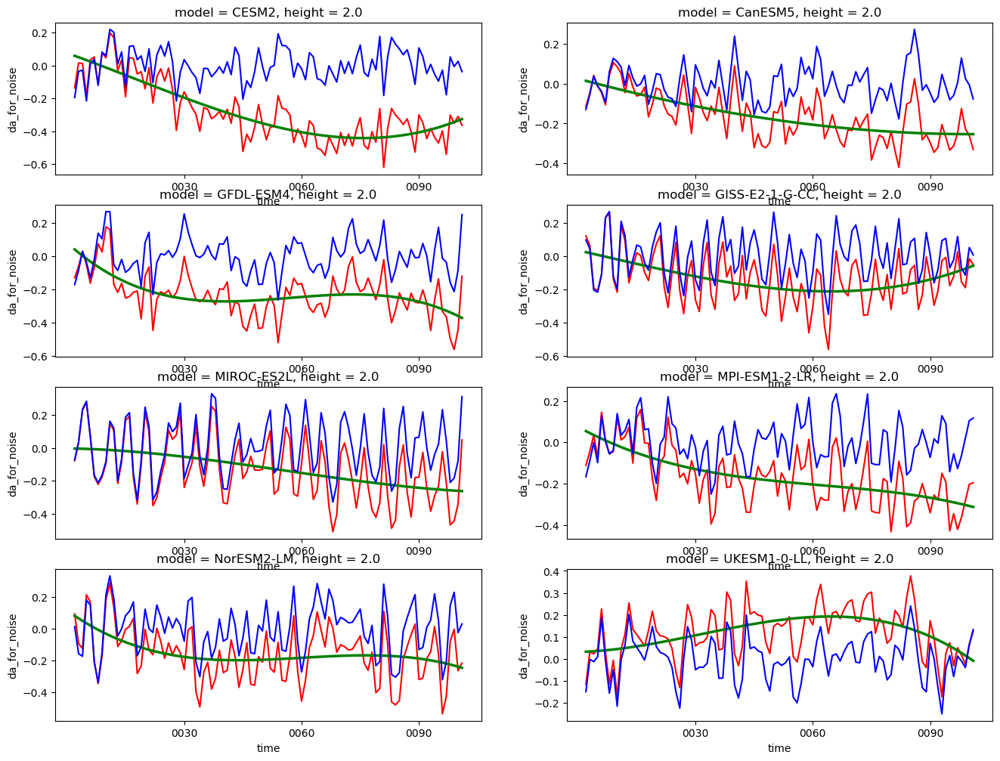

In [30]:
models = experiment_zec_ds_smean.model.values
ncols = 2
nrows = int(np.ceil(len(models)/ncols))

fig = plt.figure(figsize=(8*ncols, 3*nrows))
for plot_num, model in enumerate(models):
    ax = fig.add_subplot(nrows,ncols,plot_num+1)
    experiment_zec_ds_smean_anom.sel(model=model).plot(ax=ax, color='red')
    trend_da.sel(model=model).plot(ax=ax, linewidth=2.5, color='green')
    detrended_da.sel(model=model).plot(ax=ax, color='blue')

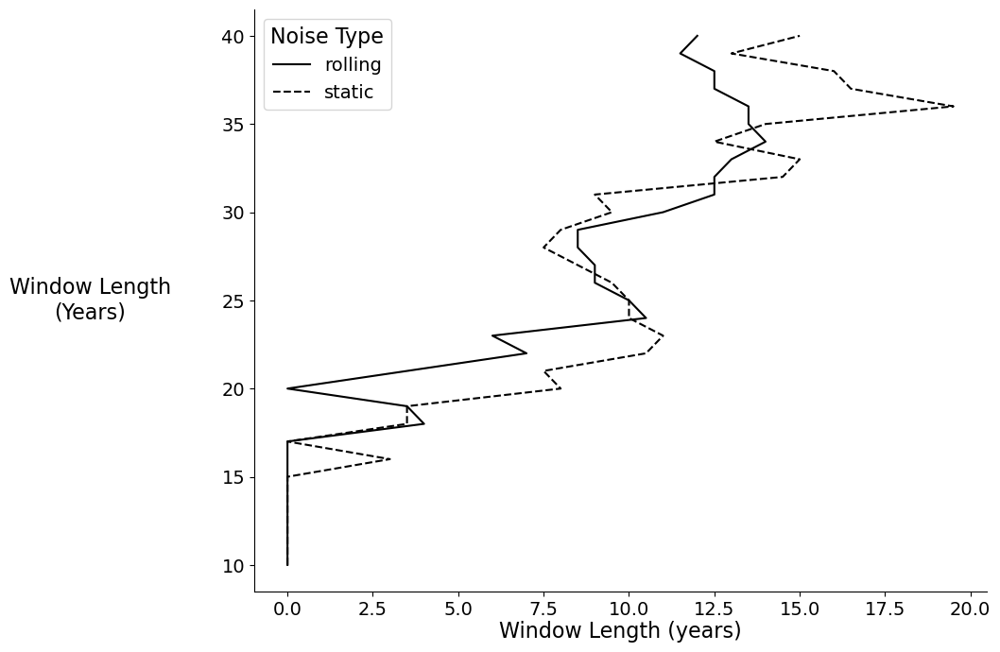

In [31]:
fig, ax = sn_plotting.plot_median_stable_year(static_year_stable, rolling_year_stable)

fig.savefig(os.path.join(constants.IMAGE_SAVE_DIR_TOP_LEVEL, f'{notebook_number}_stabilisation_year_double_poly_vs_static.png'), dpi=300, bbox_inches='tight')

In [32]:
reload(constants)
reload(sn_plotting)

<module 'sn_plotting' from '/home/563/ab2313/Documents/PhD/modules/sn_plotting.py'>

- full garbage collection released 144.19 MiB from 24910 reference cycles (threshold: 9.54 MiB)
/g/data/w40/ab2313/images/PhD/top_level/01_global_average_year_of_stabilisation_diff.png


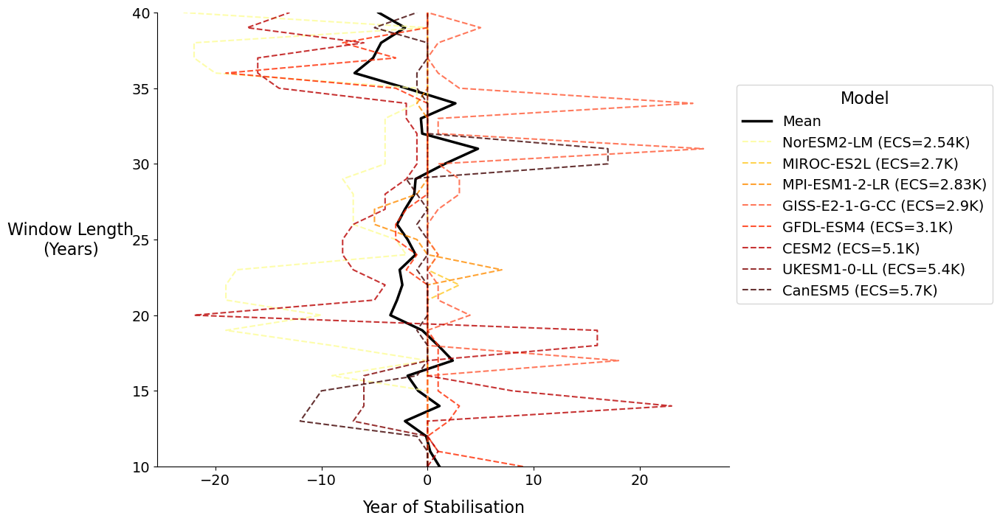

In [33]:
fig, ax = sn_plotting.plot_stable_year_all_models(static_year_stable-rolling_year_stable, exp_type='zecmip')
plt.style.use('default')
save_name = os.path.join(constants.IMAGE_SAVE_DIR_TOP_LEVEL,
                         f'{notebook_number}_global_average_year_of_stabilisation_diff.png')
print(save_name)
# fig.savefig(save_name, dpi=300, bbox_inches='tight')

In [34]:
reload(sn_plotting)
reload(constants)

<module 'constants' from '/home/563/ab2313/Documents/PhD/constants.py'>

/g/data/w40/ab2313/images/PhD/top_level/01_global_average_year_of_stabilisation_static.png


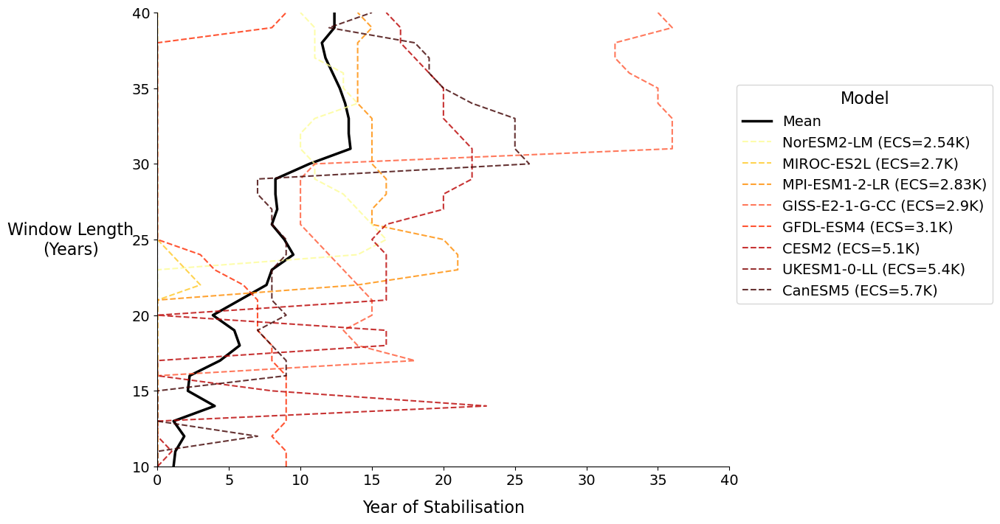

In [35]:
fig, ax = sn_plotting.plot_stable_year_all_models(static_year_stable, xlim=(0, 40), exp_type='zecmip')
save_name = os.path.join(constants.IMAGE_SAVE_DIR_TOP_LEVEL,
                         f'{notebook_number}_global_average_year_of_stabilisation_static.png')
print(save_name)
fig.savefig(save_name, dpi=300, bbox_inches='tight')

/g/data/w40/ab2313/images/PhD/top_level/01_global_average_year_of_stabilisation_rolling.png


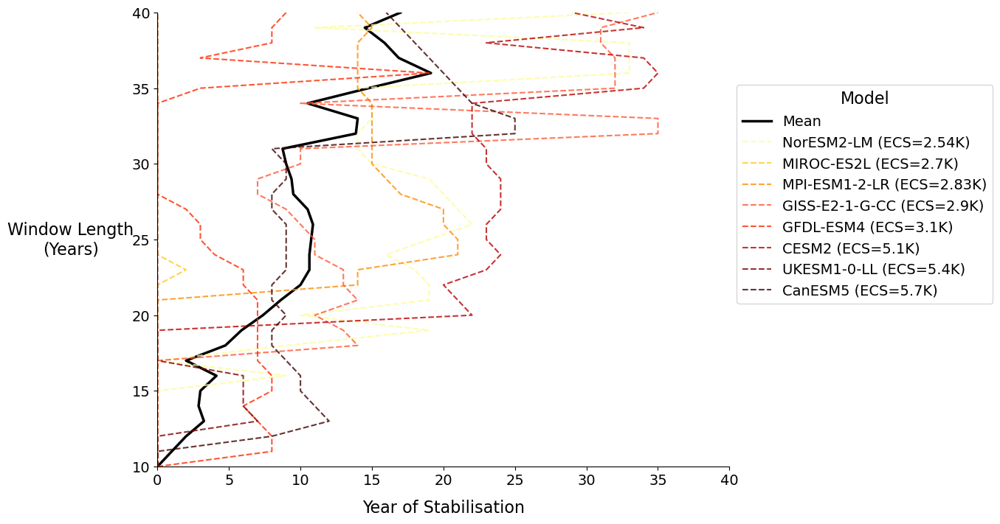

In [36]:
fig, ax = sn_plotting.plot_stable_year_all_models(rolling_year_stable, xlim=(0, 40), exp_type='zecmip')
save_name = os.path.join(constants.IMAGE_SAVE_DIR_TOP_LEVEL, f'{notebook_number}_global_average_year_of_stabilisation_rolling.png')
print(save_name)
fig.savefig(save_name, dpi=300, bbox_inches='tight')

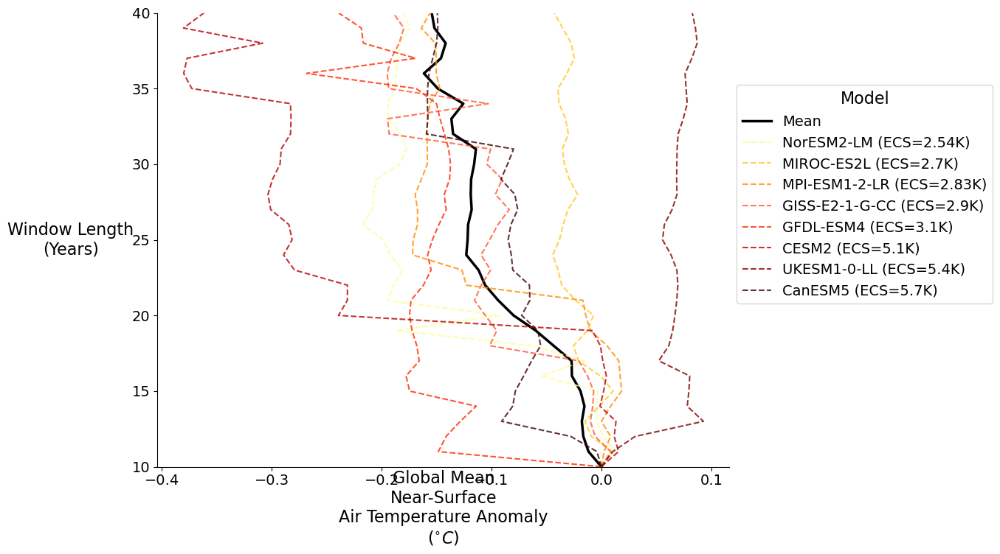

In [37]:
fig, ax = sn_plotting.plot_stable_year_all_models(stable_anom_da.to_dataset(name='time'), exp_type='zecmip', 
                                                 xlabel=f'Global Mean\n{longname} Anomaly\n({units})')

In [38]:
reload(sn_plotting)
reload(plotting_functions)

<module 'plotting_functions' from '/home/563/ab2313/Documents/PhD/modules/plotting_functions.py'>

/g/data/w40/ab2313/images/PhD/top_level/01_global_average_year_of_stabilisation_and_temp_anomaly.png


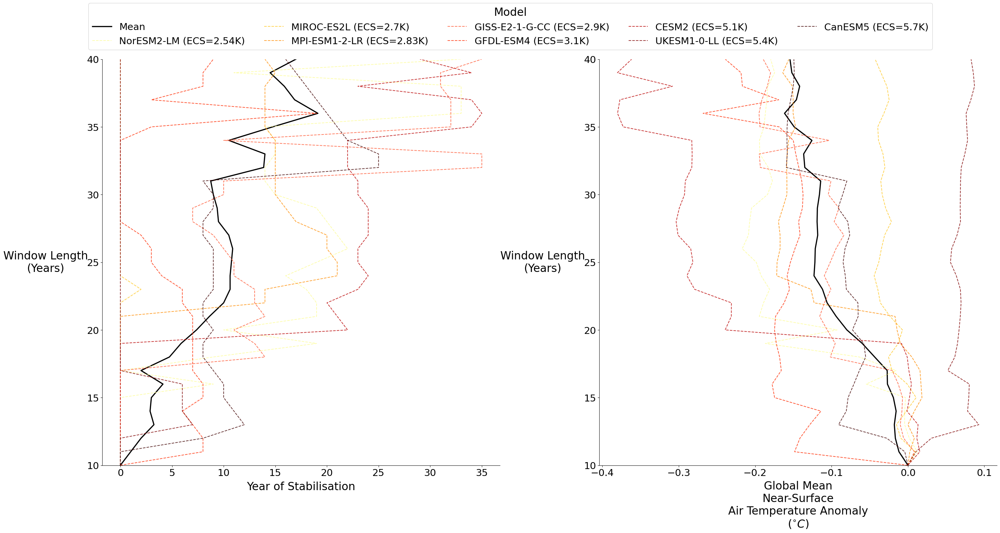

In [39]:
fig = plt.figure(figsize=(35, 16))
gs = gridspec.GridSpec(1,2, wspace=0.25)
ax1 = fig.add_subplot(gs[0])
ax2 = fig.add_subplot(gs[1])
reload(sn_plotting)
fig, ax = sn_plotting.plot_stable_year_all_models(rolling_year_stable, exp_type='zecmip', ncol=5, 
                                                 fig=fig, ax=ax1, legend_loc = 'top_ofset',
                                                 bbox_to_anchor=(2.1, 1.15), font_scale=1.5)

fig, ax =sn_plotting.plot_stable_year_all_models(
    stable_anom_da.to_dataset(name='time'), fig=fig, ax=ax2, exp_type='zecmip', 
    xlabel=f'Global Mean\n{longname} Anomaly\n({units})',
    add_legend=False, font_scale=1.5, xlabelpad=60)

save_name = os.path.join(constants.IMAGE_SAVE_DIR_TOP_LEVEL,
                         f'{notebook_number}_global_average_year_of_stabilisation_and_temp_anomaly.png')
print(save_name)
fig.savefig(save_name, dpi=300, bbox_inches='tight')

In [40]:
reload(sn_plotting)

<module 'sn_plotting' from '/home/563/ab2313/Documents/PhD/modules/sn_plotting.py'>

In [41]:
plt.style.use('default')

- full garbage collection released 360.45 MiB from 15879 reference cycles (threshold: 9.54 MiB)
/g/data/w40/ab2313/images/PhD/top_level/01_global_average_year_of_stabilisation_static_and_rolling.png


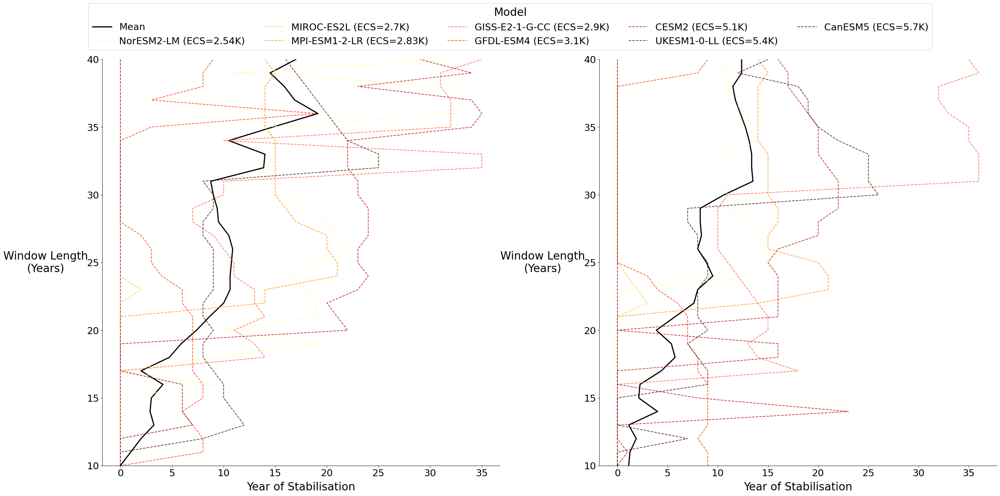

In [42]:
fig = plt.figure(figsize=(35, 16))
gs = gridspec.GridSpec(1,2, wspace=0.25)
ax1 = fig.add_subplot(gs[0]); ax2 = fig.add_subplot(gs[1])
fig, ax = sn_plotting.plot_stable_year_all_models(rolling_year_stable, exp_type='zecmip', ncol=5, 
                                                 fig=fig, ax=ax1, legend_loc = 'top_ofset',
                                                 bbox_to_anchor=(2.1, 1.15), font_scale=1.5)
fig, ax = sn_plotting.plot_stable_year_all_models(static_year_stable, exp_type='zecmip', 
                                                 fig=fig, ax=ax2, add_legend=False, font_scale=1.5)
save_name = os.path.join(constants.IMAGE_SAVE_DIR_TOP_LEVEL,
                         f'{notebook_number}_global_average_year_of_stabilisation_static_and_rolling.png')
print(save_name)
fig.savefig(save_name, dpi=300, bbox_inches='tight')

/g/data/w40/ab2313/images/PhD/top_level/01_global_average_picontrol_time_series.png


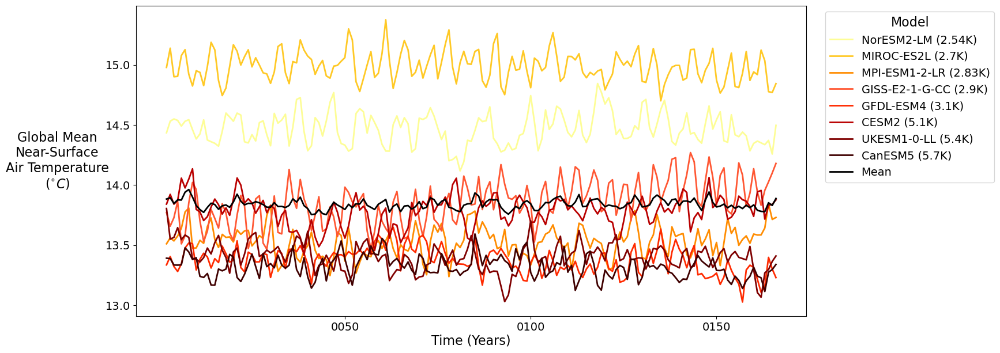

In [43]:
fig, ax = sn_plotting.plot_all_coord_lines(picontrol_zec_ds_smean-273.14, exp_type='zecmip', xlabel='Time (Years)',
                              ylabel=f'Global Mean\n{longname}\n({units})', ncol=1)
save_name = os.path.join(constants.IMAGE_SAVE_DIR_TOP_LEVEL, f'{notebook_number}_global_average_picontrol_time_series.png'); print(save_name)
fig.savefig(save_name, dpi=300, bbox_inches='tight')

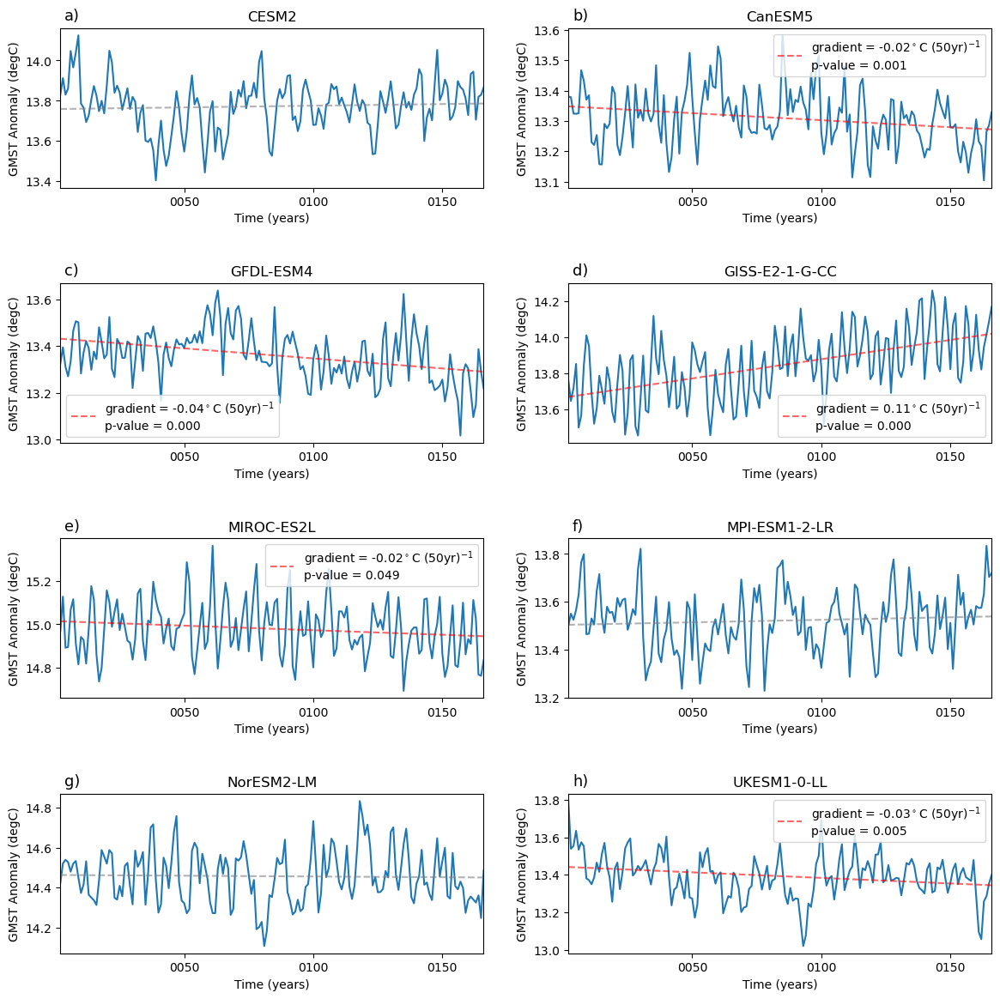

In [166]:
models = picontrol_zec_ds_smean.model.values
time = picontrol_zec_ds_smean.time.values
ncols = 2; nrows = int(np.ceil(len(models)/2))

fig = plt.figure(figsize=(14, 14))
gs = gridspec.GridSpec(nrows=nrows, ncols=ncols, hspace=0.6)

for num, model in enumerate(models):
    ax = fig.add_subplot(gs[num])
    plotting_functions.add_figure_label(ax, f'{chr(97+num)})', font_scale=0.8)
    picontrol_zec_ds_smean.sel(model=model).plot(ax=ax)
    ax.set_title(model); ax.set_ylabel('GMST Anomaly (degC)'); ax.set_xlabel('Time (years)')
    ax.set_xlim([time[0], time[-1]])
    init_y = picontrol_zec_ds_smean.sel(model=model).values

    x = np.arange(len(init_y))

    grad_yint = np.polyfit(x, init_y, deg=1)

    fitted_line = np.polyval(grad_yint, x)
    mk_val = pymannkendall.original_test(init_y)
    mk_pval = mk_val.p
    if mk_pval < 0.05:
        color = 'red'
        label = f'gradient = {grad_yint[0]*50:.2f}' + r'$^\circ$C (50yr)$^{-1}$' + f'\np-value = {mk_pval:.3f}'
    else:
        color='grey'
        label=None
    
    ax.plot(time, fitted_line, linestyle='--', alpha=0.6, color=color, label=label)
    if mk_pval < 0.05:
        ax.legend(ncol=1, loc='best')#bbox_to_anchor=(0.6, 1.06))

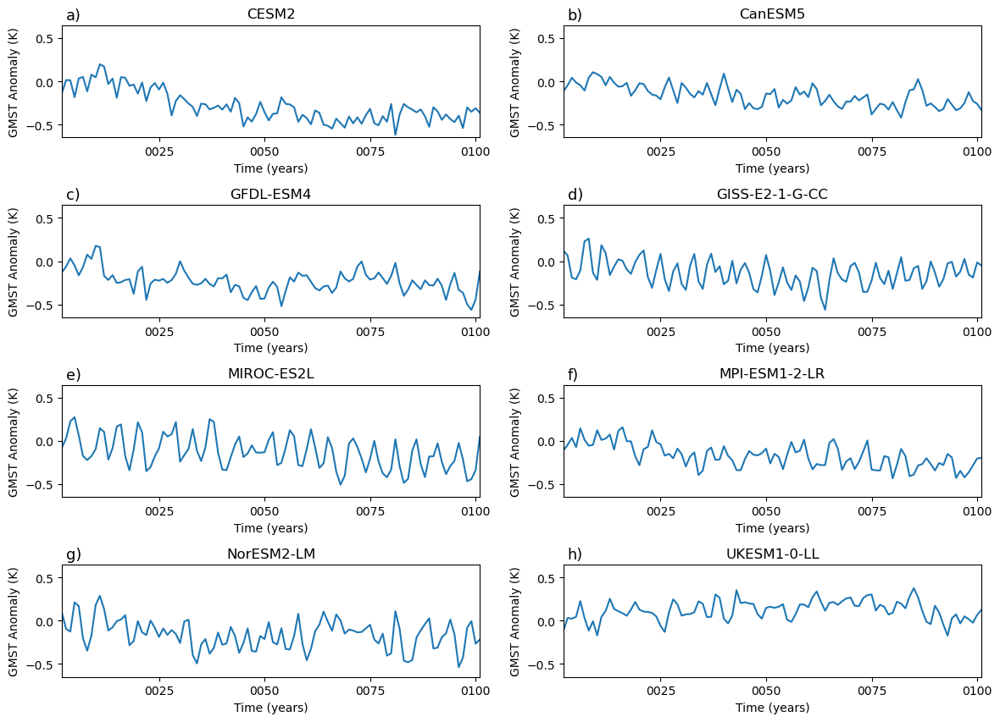

In [167]:
models = experiment_zec_ds_smean_anom.model.values
time = experiment_zec_ds_smean_anom.time.values
ncols = 2; nrows = int(np.ceil(len(models)/2))

fig = plt.figure(figsize=(14, 10))
gs = gridspec.GridSpec(nrows=nrows, ncols=ncols, hspace=0.6)

for num, model in enumerate(models):
    ax = fig.add_subplot(gs[num])
    plotting_functions.add_figure_label(ax, f'{chr(97+num)})', font_scale=0.8)
    experiment_zec_ds_smean_anom.sel(model=model).plot(ax=ax)
    ax.set_title(model); ax.set_ylabel('GMST Anomaly (K)'); ax.set_xlabel('Time (years)')
    ax.set_xlim([time[0], time[-1]])
    ax.set_ylim(-0.65, 0.65)

/g/data/w40/ab2313/images/PhD/top_level/01_global_average_A1_time_series.png


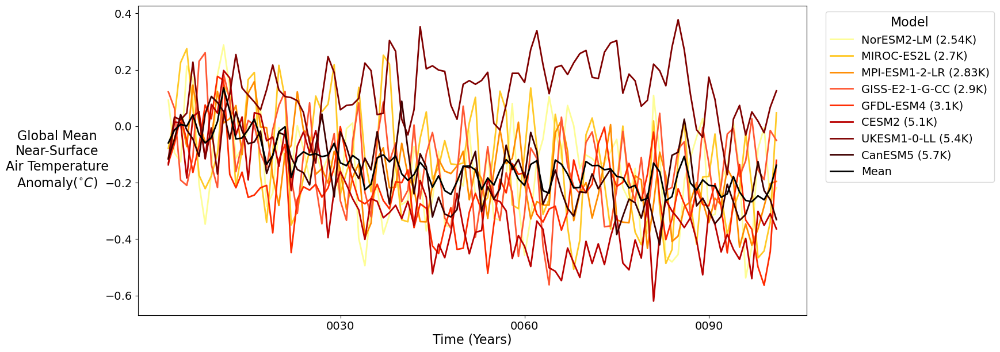

In [44]:
fig, ax = sn_plotting.plot_all_coord_lines(experiment_zec_ds_smean_anom, exp_type='zecmip',
                               xlabel='Time (Years)', ylabel=f'Global Mean\n{longname}\nAnomaly({units})', ncol=1)
save_name = os.path.join(constants.IMAGE_SAVE_DIR_TOP_LEVEL,
                         f'{notebook_number}_global_average_A1_time_series.png')
print(save_name)
fig.savefig(save_name, dpi=300, bbox_inches='tight')

In [45]:
models = rolling_year_stable.model.values
levels = np.arange(0, len(models)+1,1)
my_blues = plotting_functions.create_discrete_cmap('Blues', levels=levels, add_white=True)
my_reds = plotting_functions.create_discrete_cmap('Reds', levels=levels, add_white=True)

plot_kwargs = dict(exp_type='zecmip',vmin=0, vmax=len(models)+1, step=1, tick_offset='center',
                   extend='neither', cbar_label='Number of Unstable Models')

comparison_kwargs = dict(max_color_lim=50, xlims=(0,50), font_scale=1.6)

In [46]:
mpl.rcParams.update(mpl.rcParamsDefault)

fig = plt.figure(figsize=(sn_plotting.plot_kwargs['width'],
                          sn_plotting.plot_kwargs['height']*2.1))

gs = gridspec.GridSpec(3,1, height_ratios=[1, 1, 0.1], hspace=sn_plotting.plot_kwargs['hspace'])
axes = [fig.add_subplot(gs[i]) for i in range(3)]

sn_plotting.sn_multi_window_in_time(
    static_stability_levels_ds.sel(stability='unstable').count(dim='model'), cmap=my_blues,
    fig=fig, gs=gs, ax=axes[0], add_colorbar=False, return_all=False, axes_title='Static Noise',
    **plot_kwargs, **comparison_kwargs)

sn_plotting.sn_multi_window_in_time(
    rolling_stability_levels_ds.sel(stability='unstable').count(dim='model'), cmap=my_blues,
    fig=fig, gs=gs, ax=axes[1], cax=axes[2], return_all=False, axes_title='Rolling Noise',
    **plot_kwargs, **comparison_kwargs)


save_name = os.path.join(constants.IMAGE_SAVE_DIR_TOP_LEVEL,
   f'{notebook_number}_global_average_stabilisation_pattern_comparison_static_and_rolling.png')
print(save_name)
# fig.savefig(save_name, dpi=300, bbox_inches='tight')

/g/data/w40/ab2313/images/PhD/top_level/01_global_average_stabilisation_pattern_comparison_static_and_rolling.png


In [47]:
reload(sn_plotting)
reload(plotting_functions)
%matplotlib inline

In [48]:
stability_colorplot_kwargs = dict(max_color_lim=50, xlims=(0, 90),patch=True,
                                  ax2_ylabel=f'GMST Anomaly({units})')

/g/data/w40/ab2313/images/PhD/top_level/01_global_all_model_sn_pattern.png


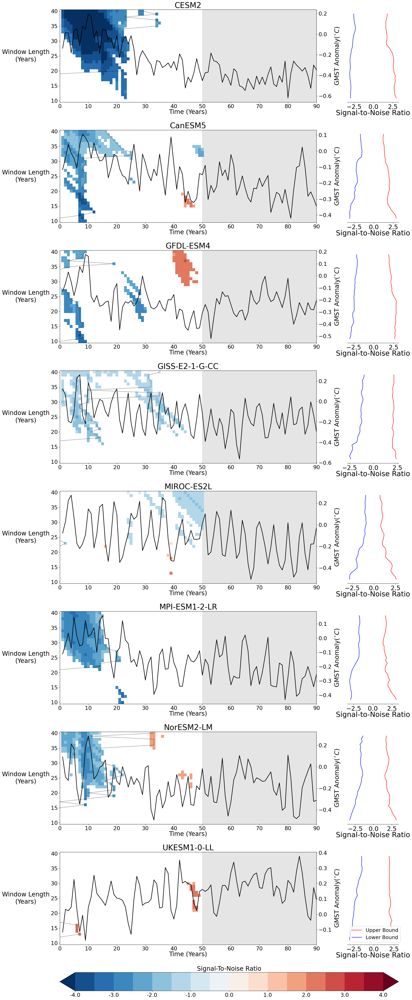

In [49]:
%matplotlib inline
models = unstable_rolling.model.values
sn_levels = np.arange(-4.5, 4.5+.5, 0.5)

fig = plt.figure(figsize=(sn_plotting.plot_kwargs['width'], 
                          sn_plotting.plot_kwargs['height']*len(models)/1.5))
gs = gridspec.GridSpec(len(models)+1, 2, height_ratios=len(models)*[1] + [0.2], width_ratios=[1, 0.2],
                       hspace=sn_plotting.plot_kwargs['hspace']*1.1)
axes_left = [fig.add_subplot(gs[i, 0]) for i in range(len(models))]
axes_right = [fig.add_subplot(gs[i, 1]) for i in range(len(models))]

for num, model in enumerate(models):
    add_colorbar=False; cax=None
    if num == len(models)-1: add_colorbar=True; cax=fig.add_subplot(gs[num+1, :])
    sn_plotting.sn_multi_window_in_time(
        unstable_rolling.sel(model=model).signal_to_noise, cmap='RdBu_r',
        fig=fig, gs=gs, ax=axes_left[num], cax=cax, add_colorbar=add_colorbar,
        axes_title=model, bbox_to_anchor=(1, 1.4),
        temp_da=experiment_zec_ds_smean_anom.sel(model=model),
        stable_point_ds = rolling_year_stable.sel(model=model), labelpad_left=65, labelpad_right=15,
        extend='both', cut_ticks=2, vmax=4, step=0.5,  font_scale=1.4, cbar_label='Signal-To-Noise Ratio',
        hspace=0.2, return_all=False, **stability_colorplot_kwargs, rotation=90)  
    
    sn_multi_rolling_ds.sel(model=model).upper_bound.plot(ax=axes_right[num], y='window', color='red',
                                                         label='Upper Bound')
    sn_multi_rolling_ds.sel(model=model).lower_bound.plot(ax=axes_right[num], y='window', color='blue',
                                                         label='Lower Bound')
    plotting_functions.format_axis(axes_right[num], xlabel='Signal-to-Noise Ratio', ylabel='',
                                  title='', font_scale=1.6)
    [axes_right[num].spines[sp].set_visible(False) for sp in ['top', 'left', 'right']]
    axes_right[num].set_yticks([])
    axes_right[num].set_yticklabels([])
    axes_right[num].set_title('')
    axes_right[num].set_ylabel('')
    if num == len(models)-1:axes_right[num].legend(ncol=1, fontsize=18)
    
for num, ax in enumerate(axes): plotting_functions.add_figure_label(ax, f'{chr(97+num)})', font_scale=1.4)
    
save_name = os.path.join(constants.IMAGE_SAVE_DIR_TOP_LEVEL,
                         f'{notebook_number}_global_all_model_sn_pattern.png')
print(save_name)
fig.savefig(save_name, dpi=300, bbox_inches='tight')

/g/data/w40/ab2313/images/PhD/top_level/01_global_average_stabilisation_pattern_rolling.png


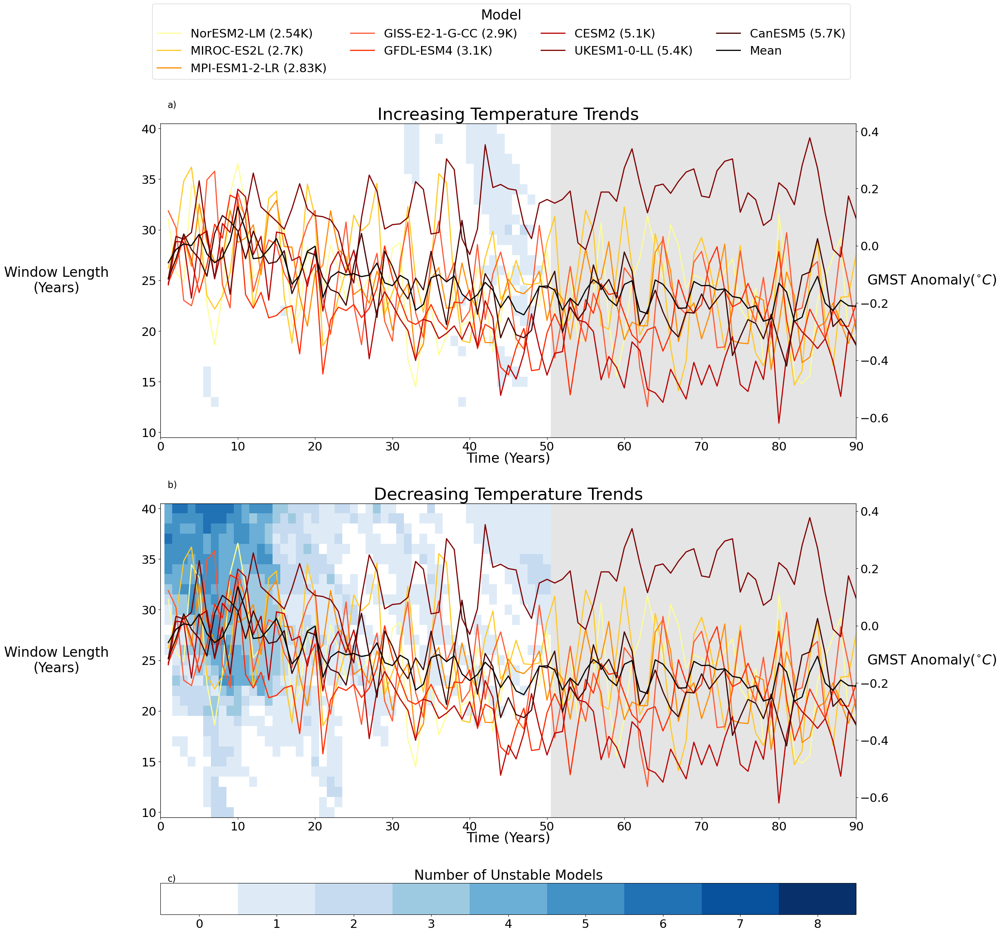

In [50]:
%matplotlib inline
fig = plt.figure(figsize=(sn_plotting.plot_kwargs['width'], sn_plotting.plot_kwargs['height']*2.1))

gs = gridspec.GridSpec(3,1, height_ratios=[1, 1, 0.1], hspace=sn_plotting.plot_kwargs['hspace'])
axes = [fig.add_subplot(gs[i]) for i in range(3)]

sn_plotting.sn_multi_window_in_time(
    rolling_stability_levels_ds.sel(stability='increasing').count(dim='model'), cmap=my_blues,
    fig=fig, gs=gs, ax=axes[0], add_colorbar=False, return_all=False,
    axes_title='Increasing Temperature Trends', bbox_to_anchor=(1, 1.4),
    temp_da=experiment_zec_ds_smean_anom,  **stability_colorplot_kwargs,  **plot_kwargs)

sn_plotting.sn_multi_window_in_time(
    rolling_stability_levels_ds.sel(stability='decreasing').count(dim='model'), cmap=my_blues,
    fig=fig, gs=gs, ax=axes[1], cax=axes[2], return_all=False,
    axes_title='Decreasing Temperature Trends',
    add_legend=False,
    temp_da=experiment_zec_ds_smean_anom, **stability_colorplot_kwargs,  **plot_kwargs)


for num, ax_ in enumerate(axes):
    plotting_functions.add_figure_label(ax_, f'{chr(97+num)})')

save_name = os.path.join(constants.IMAGE_SAVE_DIR_TOP_LEVEL,
                         f'{notebook_number}_global_average_stabilisation_pattern_rolling.png')
print(save_name)
fig.savefig(save_name, dpi=300, bbox_inches='tight')

In [51]:
stability_colorplot_kwargs_no_temp_line = dict(max_color_lim=50, xlims=(0, 50),patch=False,
                                  ax2_ylabel=f'GMST Anomaly({units})', labelpad_left=70)

/g/data/w40/ab2313/images/PhD/top_level/01_global_average_stabilisation_pattern_rolling_vs_static.png


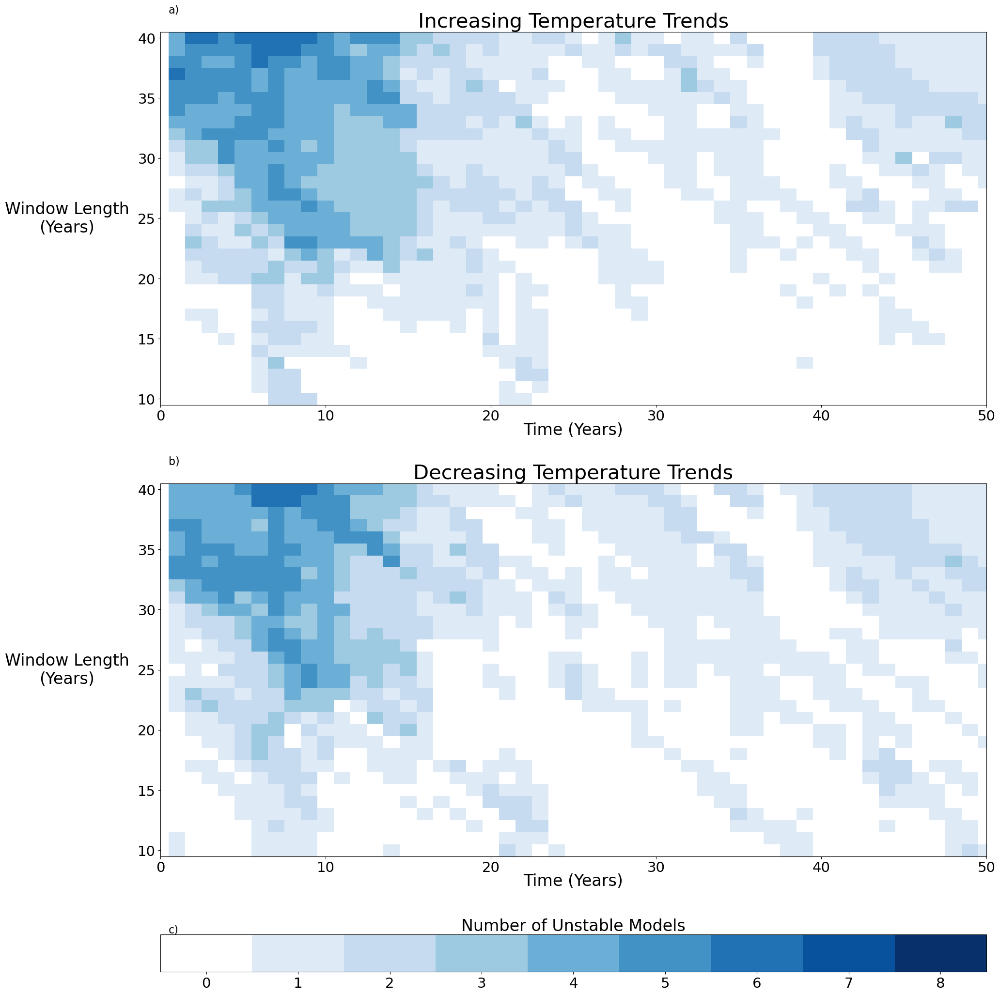

In [52]:
%matplotlib inline
fig = plt.figure(figsize=(sn_plotting.plot_kwargs['width'], sn_plotting.plot_kwargs['height']*2.1))

gs = gridspec.GridSpec(3,1, height_ratios=[1, 1, 0.1], hspace=sn_plotting.plot_kwargs['hspace'])
axes = [fig.add_subplot(gs[i]) for i in range(3)]

sn_plotting.sn_multi_window_in_time(
    rolling_stability_levels_ds.sel(stability='increasing').count(dim='model')+ rolling_stability_levels_ds.sel(stability='decreasing').count(dim='model'),
    cmap=my_blues,
    fig=fig, gs=gs, ax=axes[0], add_colorbar=False, return_all=False,
    axes_title='Increasing Temperature Trends', bbox_to_anchor=(1, 1.4),
    **stability_colorplot_kwargs_no_temp_line,  **plot_kwargs)

sn_plotting.sn_multi_window_in_time(
    static_stability_levels_ds.sel(stability='increasing').count(dim='model')+ static_stability_levels_ds.sel(stability='decreasing').count(dim='model')
    , cmap=my_blues,
    fig=fig, gs=gs, ax=axes[1], cax=axes[2], return_all=False,
    axes_title='Decreasing Temperature Trends',
    add_legend=False, **stability_colorplot_kwargs_no_temp_line,  **plot_kwargs)


for num, ax_ in enumerate(axes):
    plotting_functions.add_figure_label(ax_, f'{chr(97+num)})')

save_name = os.path.join(constants.IMAGE_SAVE_DIR_TOP_LEVEL,
                         f'{notebook_number}_global_average_stabilisation_pattern_rolling_vs_static.png')
print(save_name)
fig.savefig(save_name, dpi=300, bbox_inches='tight')

/g/data/w40/ab2313/images/PhD/top_level/01_global_average_stabilisation_pattern_rolling_no_gmst_anom.png


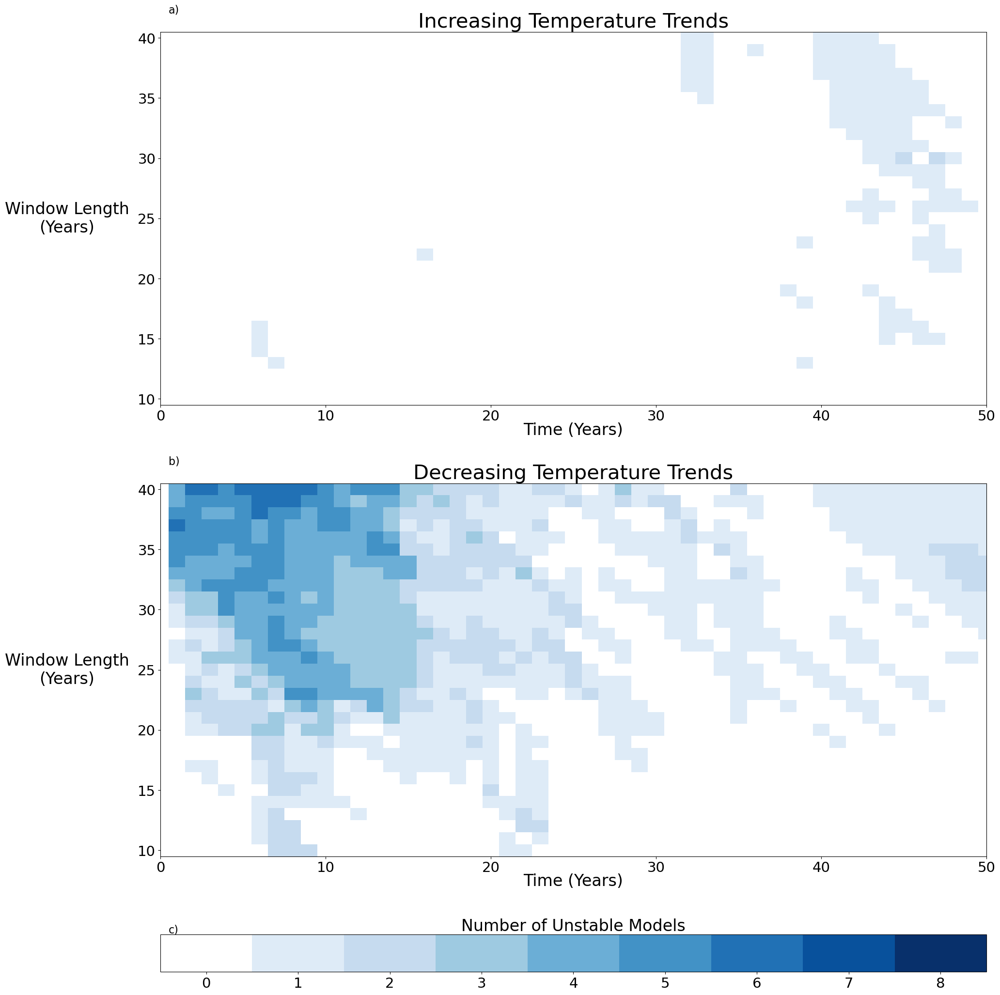

In [53]:
%matplotlib inline
fig = plt.figure(figsize=(sn_plotting.plot_kwargs['width'], sn_plotting.plot_kwargs['height']*2.1))

gs = gridspec.GridSpec(3,1, height_ratios=[1, 1, 0.1], hspace=sn_plotting.plot_kwargs['hspace'])
axes = [fig.add_subplot(gs[i]) for i in range(3)]

sn_plotting.sn_multi_window_in_time(
    rolling_stability_levels_ds.sel(stability='increasing').count(dim='model'), cmap=my_blues,
    fig=fig, gs=gs, ax=axes[0], add_colorbar=False, return_all=False,
    axes_title='Increasing Temperature Trends', bbox_to_anchor=(1, 1.4),
    **stability_colorplot_kwargs_no_temp_line,  **plot_kwargs)

sn_plotting.sn_multi_window_in_time(
    rolling_stability_levels_ds.sel(stability='decreasing').count(dim='model'), cmap=my_blues,
    fig=fig, gs=gs, ax=axes[1], cax=axes[2], return_all=False,
    axes_title='Decreasing Temperature Trends',
    add_legend=False, **stability_colorplot_kwargs_no_temp_line,  **plot_kwargs)


for num, ax_ in enumerate(axes):
    plotting_functions.add_figure_label(ax_, f'{chr(97+num)})')

save_name = os.path.join(constants.IMAGE_SAVE_DIR_TOP_LEVEL,
                         f'{notebook_number}_global_average_stabilisation_pattern_rolling_no_gmst_anom.png')
print(save_name)
fig.savefig(save_name, dpi=300, bbox_inches='tight')

In [54]:
%matplotlib inline

- full garbage collection released 483.40 MiB from 31030 reference cycles (threshold: 9.54 MiB)
/g/data/w40/ab2313/images/PhD/top_level/01_global_average_stabilisation_pattern_warming_static.png


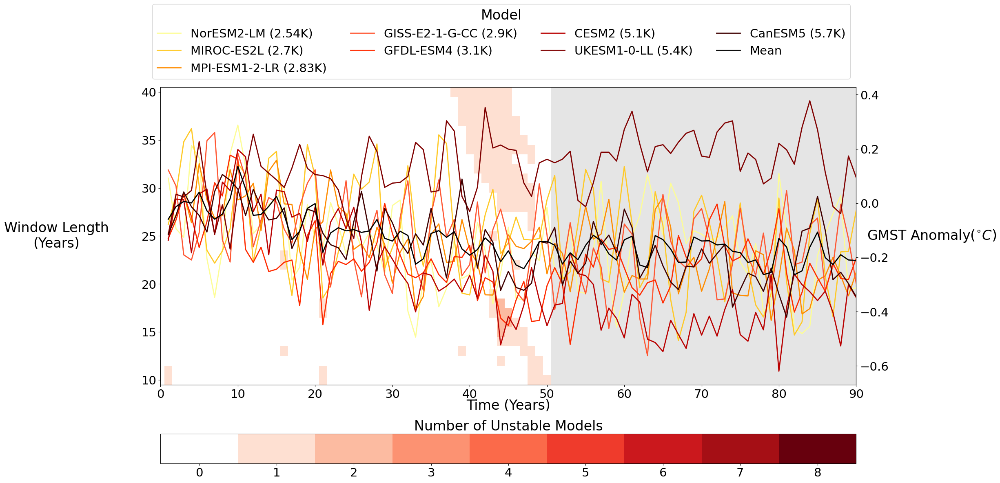

In [55]:
fig, axes = sn_plotting.sn_multi_window_in_time(
    static_stability_levels_ds.sel(stability='increasing').count(dim='model'),
    temp_da=experiment_zec_ds_smean_anom, cmap=my_reds, **stability_colorplot_kwargs,  **plot_kwargs)
fig

save_name = os.path.join(constants.IMAGE_SAVE_DIR_TOP_LEVEL,
                         f'{notebook_number}_global_average_stabilisation_pattern_warming_static.png')
print(save_name)
# fig.savefig(save_name, dpi=300, bbox_inches='tight')

In [56]:
reload(sn_plotting)

<module 'sn_plotting' from '/home/563/ab2313/Documents/PhD/modules/sn_plotting.py'>

/g/data/w40/ab2313/images/PhD/top_level/01_global_average_stabilisation_pattern_cooling_static_no_gmst_anom.png


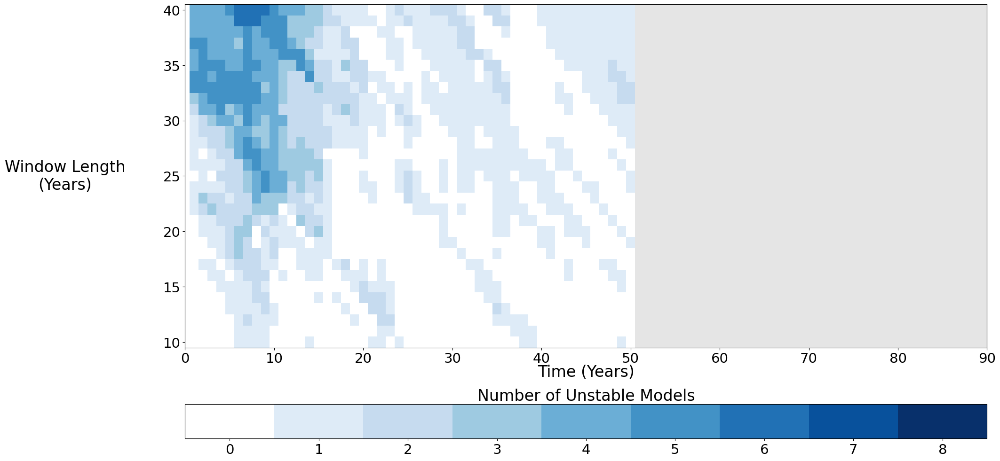

In [57]:
fig, axes = sn_plotting.sn_multi_window_in_time(
    static_stability_levels_ds.sel(stability='decreasing').count(dim='model'),
    cmap=my_blues, **stability_colorplot_kwargs,  **plot_kwargs)

save_name = os.path.join(constants.IMAGE_SAVE_DIR_TOP_LEVEL,
                         f'{notebook_number}_global_average_stabilisation_pattern_cooling_static_no_gmst_anom.png')
print(save_name)
# fig.savefig(save_name, dpi=300, bbox_inches='tight')

/g/data/w40/ab2313/images/PhD/top_level/01_global_average_stabilisation_pattern_cooling_static.png


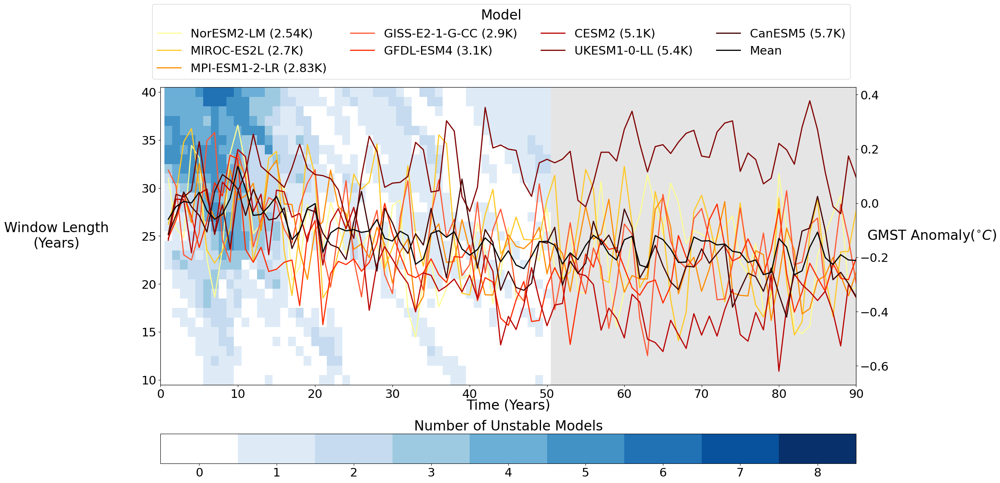

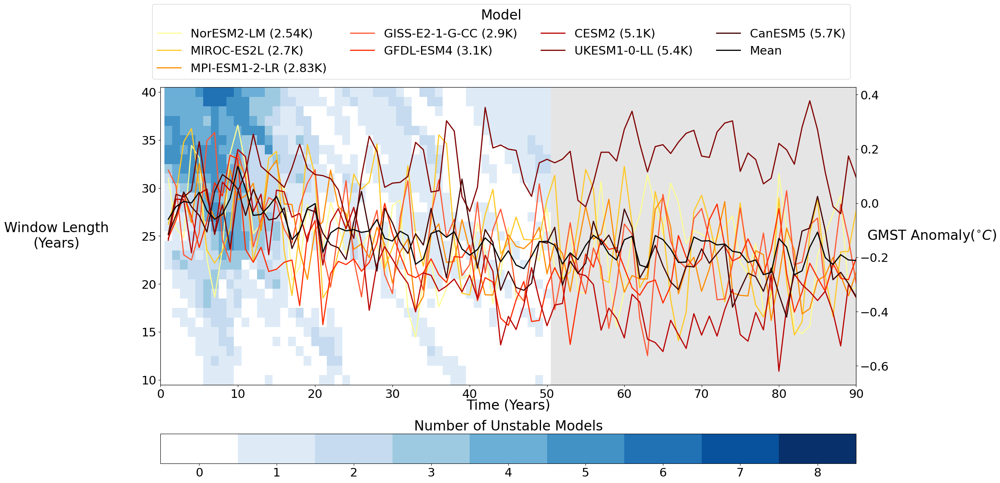

In [58]:
fig, axes = sn_plotting.sn_multi_window_in_time(
    static_stability_levels_ds.sel(stability='decreasing').count(dim='model'),
    temp_da=experiment_zec_ds_smean_anom, cmap=my_blues, **stability_colorplot_kwargs,  **plot_kwargs)

save_name = os.path.join(constants.IMAGE_SAVE_DIR_TOP_LEVEL,
                         f'{notebook_number}_global_average_stabilisation_pattern_cooling_static.png')
print(save_name)
fig.savefig(save_name, dpi=300, bbox_inches='tight')
fig

In [59]:
%matplotlib inline

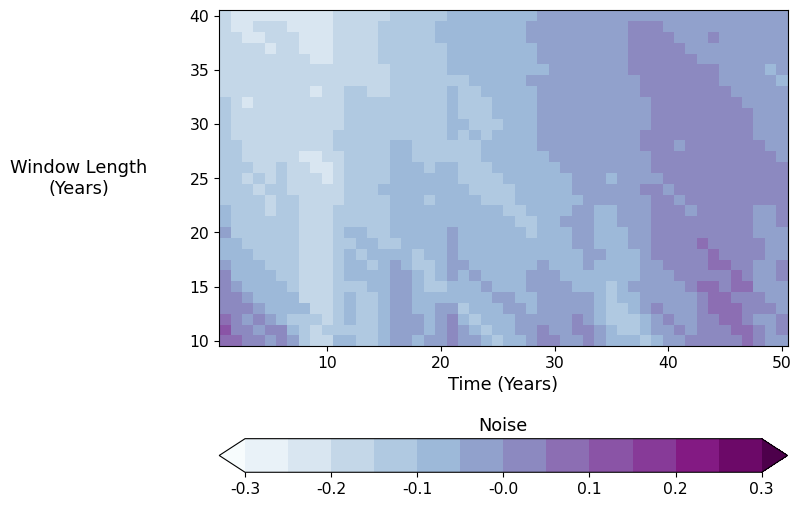

In [60]:
signal_levels = sn_plotting.create_levels(vmax=.3, vmin=-.3, step=.05)

sn_plotting.plot_heatmap(sn_multi_rolling_ds.signal.mean(dim='model'), levels=signal_levels, 
                                figsize=(sn_plotting.plot_kwargs['width']/3,
                                         sn_plotting.plot_kwargs['height']/2), 
                               cmap='BuPu', extend='both', cut_ticks=2, max_color_lim=50, 
                               font_scale=0.8, cbar_label='Noise', hspace=0.2, return_all=False)

save_name = os.path.join(constants.IMAGE_SAVE_DIR_TOP_LEVEL,
                         f'{notebook_number}_global_average_signal_rolling.png')
# print(save_name)
# fig.savefig(save_name, dpi=300, bbox_inches='tight')

/g/data/w40/ab2313/images/PhD/top_level/01_global_average_noise_rolling.png


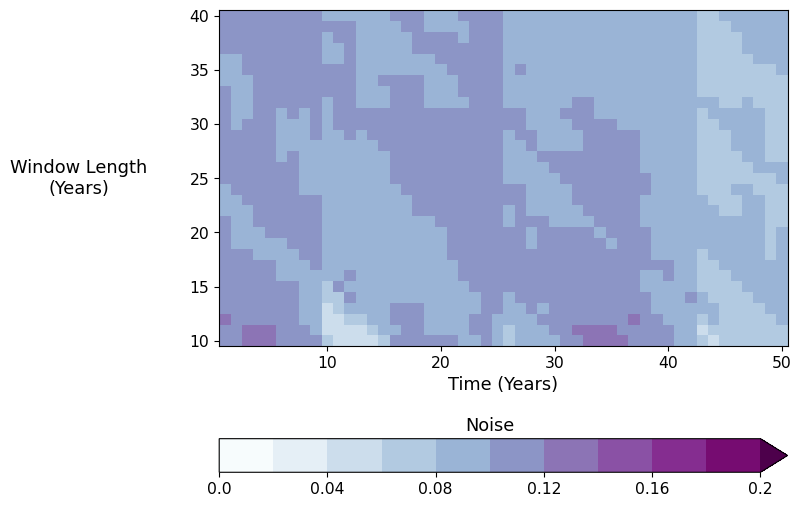

In [61]:
noise_levels = sn_plotting.create_levels(vmax=.2, vmin=0, step=.02)
sn_plotting.plot_heatmap(sn_multi_rolling_ds.noise.isel(model=7), levels=noise_levels, 
                                figsize=(sn_plotting.plot_kwargs['width']/3,
                                         sn_plotting.plot_kwargs['height']/2), 
                               cmap='BuPu', extend='max', cut_ticks=2, max_color_lim=50, 
                               font_scale=0.8, cbar_label='Noise', hspace=0.2, return_all=False)

save_name = os.path.join(constants.IMAGE_SAVE_DIR_TOP_LEVEL,
                         f'{notebook_number}_global_average_noise_rolling.png')
print(save_name)
# fig.savefig(save_name, dpi=300, bbox_inches='tight')

/g/data/w40/ab2313/images/PhD/top_level/01_global_average_noise_rolling.png


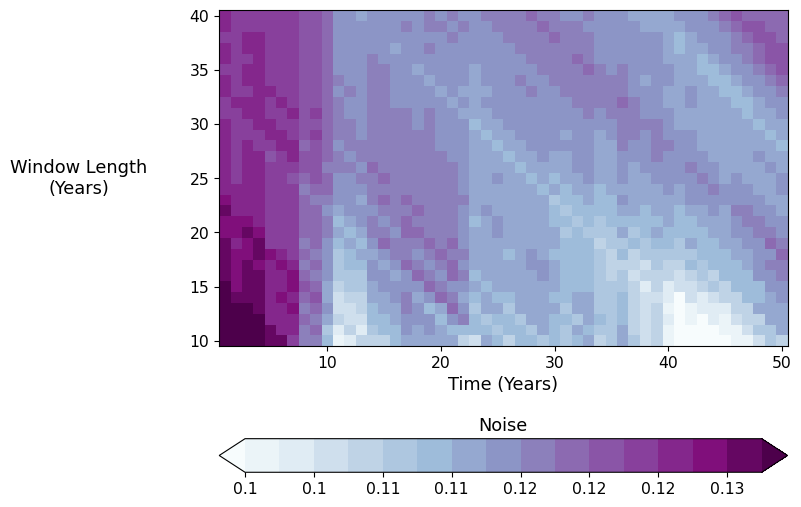

In [62]:
noise_levels = sn_plotting.create_levels(vmax=.13, vmin=0.1, step=.002)
sn_plotting.plot_heatmap(sn_multi_rolling_ds.noise.mean(dim='model'), levels=noise_levels, 
                                figsize=(sn_plotting.plot_kwargs['width']/3,
                                         sn_plotting.plot_kwargs['height']/2), 
                               cmap='BuPu', extend='both', cut_ticks=2, max_color_lim=50, 
                               font_scale=0.8, cbar_label='Noise', hspace=0.2, return_all=False)

save_name = os.path.join(constants.IMAGE_SAVE_DIR_TOP_LEVEL,
                         f'{notebook_number}_global_average_noise_rolling.png')
print(save_name)
fig.savefig(save_name, dpi=300, bbox_inches='tight')

In [63]:
percent_frac = sn_multi_rolling_ds.noise*100/sn_multi_static_ds.noise
diff = sn_multi_rolling_ds.noise - sn_multi_static_ds.noise
percent_diff = diff * 100/sn_multi_rolling_ds.noise

In [64]:
# plot_kwargs_2 = dict(height=12, width=22, hspace=0.3, #vmin=-8, vmax=8, step=2, 
#                    cmap = 'RdBu_r', line_color = 'limegreen', line_alpha=0.65, 
#                    ax2_ylabel = 'Anomaly', cbar_label = 'Signal-to-Noise', cbartick_offset=0,
#                    axes_title='',
#                    title='', label_size=12, extend='both', xlowerlim=None, xupperlim=None,  filter_max=True,)